# Simulation | [44,-23] Synchrotron | FoV2

In [1]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_44_23_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_44_23_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_44_23_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_44_23_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [2]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [3]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [4]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gsync_simmap()

0.9658343680202961
1.0233329460024834
0.2663135211914778
0.26053630374372005


In [5]:
SF4_fitmap, SF2_fitmap = load_Gsync_fitmap()

0.05448065511882305
0.1995383556932211


#### Set-up gss-map

In [6]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [7]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV2x2

In [8]:
Sfov2 = GalacticDev( comp='Gsync', nside=32768, use_G02=True, center=( 44,-23 ), extra_large_mode=True, grfmap=fov2grf, grfpatch=True, fov = ( 2, 2 ), sim_pixel = 2, default=True )

2022-08-13 15:17:05,729 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 15:17:05,730 : createlog : INFO : Log standard output streaming is False
2022-08-13 15:17:05,731 : createlog : INFO : GSim_Gsync_Default_True_08_13_2022_151705.log log file is created
2022-08-13 15:17:05,731 : createlog : INFO : Log is created by cxshan
2022-08-13 15:17:05,732 : createlog : INFO : Log level is debug
2022-08-13 15:17:05,732 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 15:17:05,733 : __init__ : INFO :  Galactic Gsync simulation is initializing! 
2022-08-13 15:17:05,734 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 15:17:05,735 : _set_comp : INFO : compID is galactic/synchrotron, name is Galactic synchrotron (unpolarized)
2022-08-13 15:17:05,735 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 15:17:05,736 : _set_default_params : INFO :  

 Please update the healpix maps when you need to. 


In [9]:
Sfov2.set_gamma(-2.2198359)

2022-08-13 15:17:07,730 : set_gamma : INFO :  gamma is set as -2.2198359 


In [10]:
Sfov2.set_alpha(0.0617456648758479)
Sfov2.set_beta(0.22735294046046467)

2022-08-13 15:17:07,755 : set_alpha : INFO :  alpha is set as 0.0617456648758479 
2022-08-13 15:17:07,756 : set_beta : INFO :  beta is set as 0.22735294046046467 


#### Set up frequency simulation

In [11]:
Sfov2._set_up_freq()

2022-08-13 15:17:45,870 : gen_simmap : INFO :  Finish generating the original image for simulation, using 38.07909032329917 s.
2022-08-13 15:17:45,873 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 15:18:23,954 : gen_simmap : INFO :  Finish generating the spectral index patch image for simulation, using 37.497864278033376 s.
2022-08-13 15:18:23,957 : _set_physical_params : INFO :  Physical params are set. 


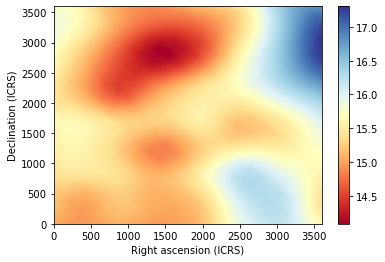

In [12]:
Sfov2.viewslice(Sfov2.patch_map)

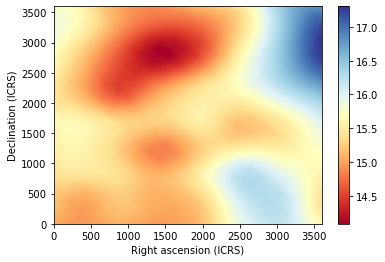

In [13]:
Sfov2.viewslice(Sfov2.skypatch.data)

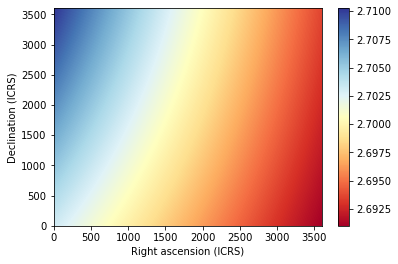

In [14]:
Sfov2.viewslice(Sfov2.patch_id)

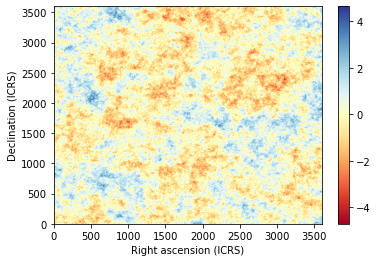

In [15]:
Sfov2.viewslice(Sfov2.patch_gss)

In [16]:
smoothed_input_map = Sfov2.smooth_sky(0.15, Sfov2.skypatch)

2022-08-13 15:18:35,245 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffb7b19cc50> with a Gaussian filter ...
2022-08-13 15:19:04,995 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 252.00 [pixel]


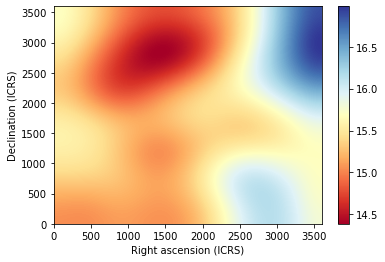

In [17]:
Sfov2.viewslice(smoothed_input_map)

In [18]:
Sfov2.skypatch.data = smoothed_input_map

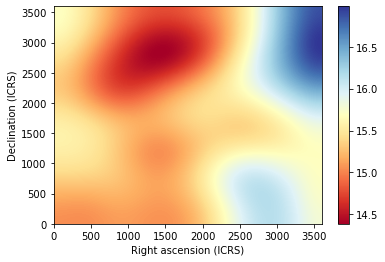

In [19]:
Sfov2.viewslice(Sfov2.skypatch.data)

In [20]:
Sfov2.filename_pattern = '{prefix}_fov4_44-23_{frequency:06.2f}.fits'

In [21]:
Sfov2.filename_pattern

'{prefix}_fov4_44-23_{frequency:06.2f}.fits'

### Simulate one freq

In [22]:
F158 = Sfov2.simulate_frequency(158,skytype='patch')

2022-08-13 15:19:10,948 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 15:19:12,815 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:19:15,086 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


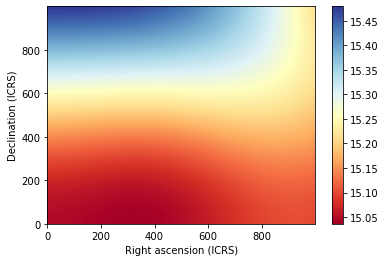

In [23]:
Sfov2.viewslice(Sfov2.skypatch.data[0:1000,0:1000])

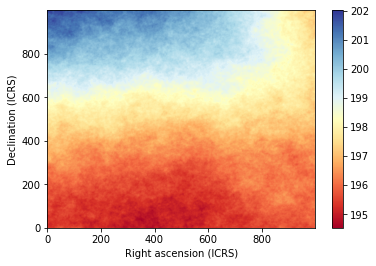

In [24]:
Sfov2.viewslice(F158.data[0:1000,0:1000])

### Simulate full freq bands

In [25]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

In [26]:
fov2_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196'
fov2_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162'
fov2_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128'

##### Low band

2022-08-13 15:23:37,357 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:23:37,359 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.00 [MHz] ...
2022-08-13 15:23:39,168 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:23:41,486 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 15:23:41,829 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_120.00.fits']


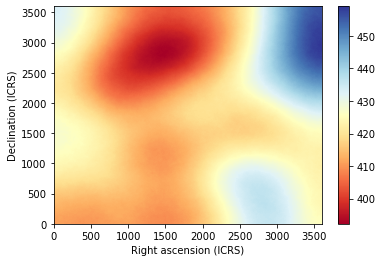

2022-08-13 15:23:44,021 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:23:44,023 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.16 [MHz] ...
2022-08-13 15:23:45,782 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:23:47,973 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 15:23:48,298 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_120.16.fits']


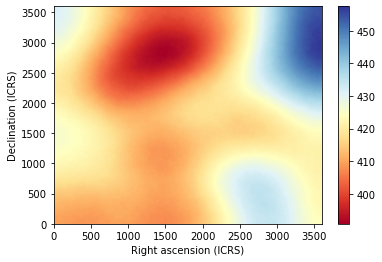

2022-08-13 15:23:50,433 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:23:50,435 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.32 [MHz] ...
2022-08-13 15:23:52,222 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:23:54,402 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 15:23:54,721 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_120.32.fits']


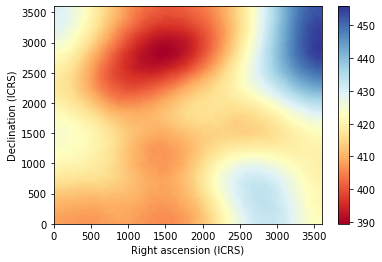

2022-08-13 15:23:56,874 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:23:56,877 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.48 [MHz] ...
2022-08-13 15:23:58,644 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:00,865 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 15:24:01,197 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_120.48.fits']


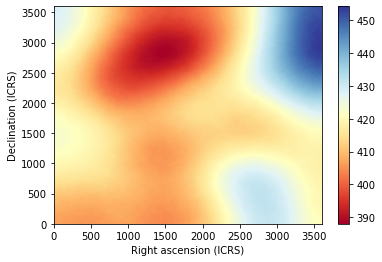

2022-08-13 15:24:03,339 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:03,342 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.64 [MHz] ...
2022-08-13 15:24:05,111 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:07,290 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 15:24:07,602 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_120.64.fits']


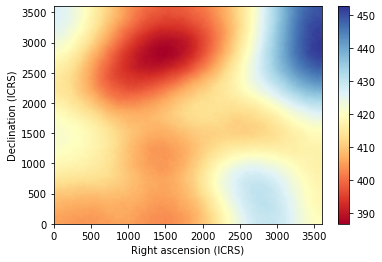

2022-08-13 15:24:09,782 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:09,784 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.80 [MHz] ...
2022-08-13 15:24:11,563 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:13,790 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 15:24:14,098 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_120.80.fits']


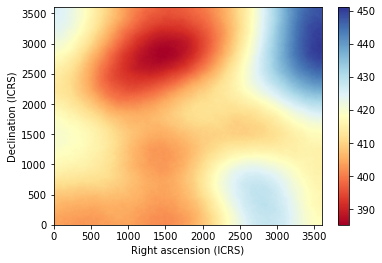

2022-08-13 15:24:16,245 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:16,248 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.96 [MHz] ...
2022-08-13 15:24:18,038 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:20,204 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 15:24:20,529 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_120.96.fits']


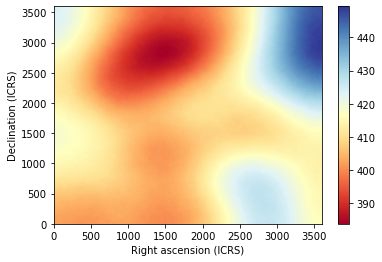

2022-08-13 15:24:22,684 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:22,686 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.12 [MHz] ...
2022-08-13 15:24:24,478 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:26,627 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 15:24:26,942 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_121.12.fits']


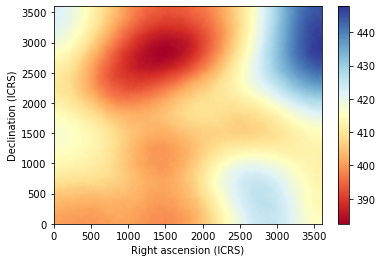

2022-08-13 15:24:29,117 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:29,120 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.28 [MHz] ...
2022-08-13 15:24:30,887 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:33,055 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 15:24:33,352 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_121.28.fits']


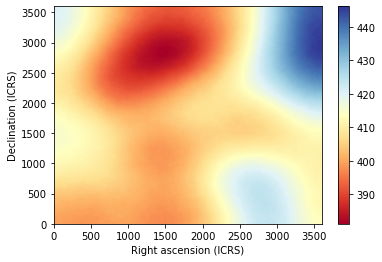

2022-08-13 15:24:35,564 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:35,566 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.44 [MHz] ...
2022-08-13 15:24:37,379 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:39,575 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 15:24:39,897 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_121.44.fits']


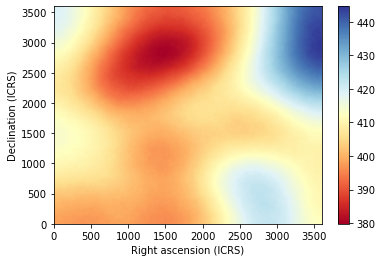

2022-08-13 15:24:42,723 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:42,726 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.60 [MHz] ...
2022-08-13 15:24:44,460 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:46,711 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 15:24:47,036 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_121.60.fits']


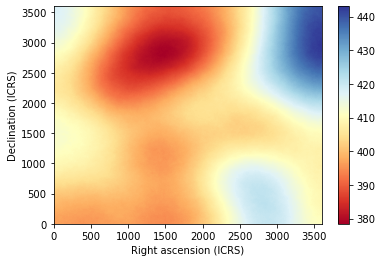

2022-08-13 15:24:49,214 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:49,216 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.76 [MHz] ...
2022-08-13 15:24:51,039 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:53,224 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 15:24:53,540 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_121.76.fits']


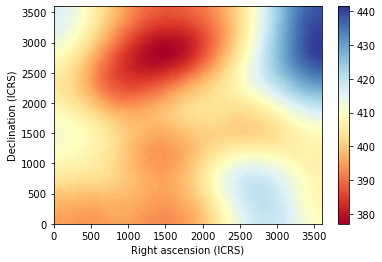

2022-08-13 15:24:55,767 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:55,770 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.92 [MHz] ...
2022-08-13 15:24:57,578 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:24:59,814 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 15:25:00,186 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_121.92.fits']


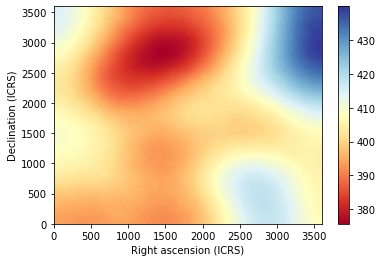

2022-08-13 15:25:02,389 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:02,391 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.08 [MHz] ...
2022-08-13 15:25:04,148 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:06,322 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 15:25:06,629 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_122.08.fits']


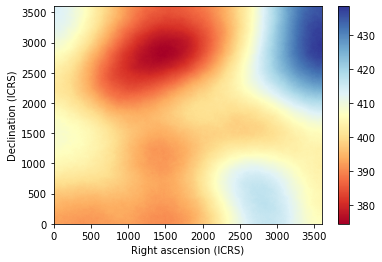

2022-08-13 15:25:08,785 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:08,788 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.24 [MHz] ...
2022-08-13 15:25:10,582 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:12,784 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 15:25:13,135 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_122.24.fits']


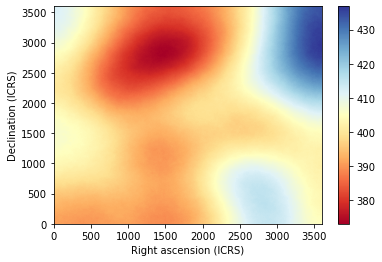

2022-08-13 15:25:15,274 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:15,277 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.40 [MHz] ...
2022-08-13 15:25:17,074 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:19,241 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 15:25:19,566 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_122.40.fits']


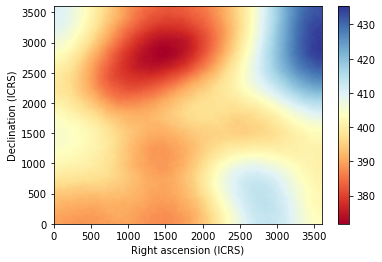

2022-08-13 15:25:21,720 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:21,723 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.56 [MHz] ...
2022-08-13 15:25:23,498 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:25,651 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 15:25:25,959 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_122.56.fits']


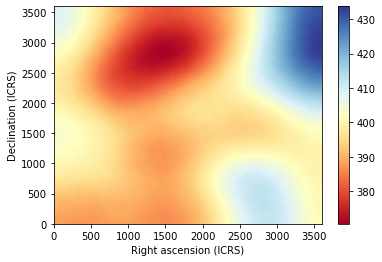

2022-08-13 15:25:28,143 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:28,146 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.72 [MHz] ...
2022-08-13 15:25:29,907 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:32,073 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 15:25:32,369 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_122.72.fits']


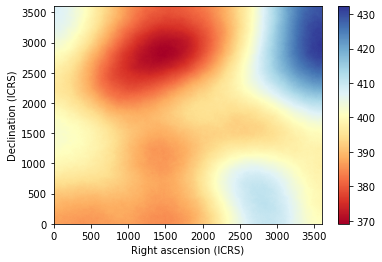

2022-08-13 15:25:34,613 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:34,615 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.88 [MHz] ...
2022-08-13 15:25:36,432 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:38,649 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 15:25:38,969 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_122.88.fits']


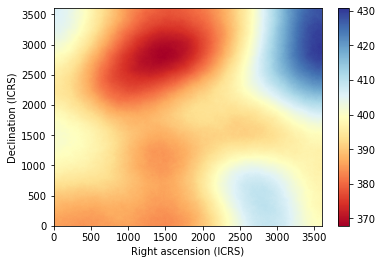

2022-08-13 15:25:41,171 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:41,174 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.04 [MHz] ...
2022-08-13 15:25:42,952 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:45,195 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 15:25:45,510 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_123.04.fits']


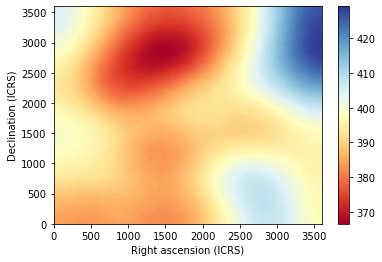

2022-08-13 15:25:47,654 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:47,657 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.20 [MHz] ...
2022-08-13 15:25:49,433 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:51,631 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 15:25:51,958 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_123.20.fits']


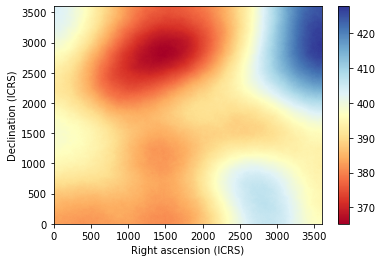

2022-08-13 15:25:54,804 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:54,807 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.36 [MHz] ...
2022-08-13 15:25:56,596 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:25:58,823 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 15:25:59,195 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_123.36.fits']


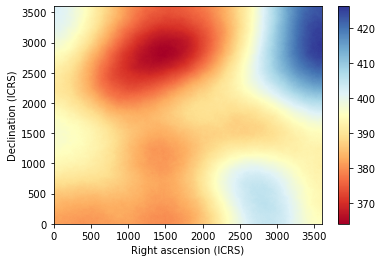

2022-08-13 15:26:01,403 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:01,406 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.52 [MHz] ...
2022-08-13 15:26:03,174 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:05,357 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 15:26:05,701 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_123.52.fits']


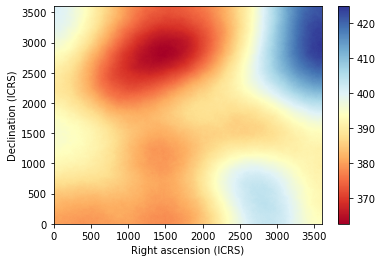

2022-08-13 15:26:07,875 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:07,879 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.68 [MHz] ...
2022-08-13 15:26:09,642 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:11,845 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 15:26:12,163 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_123.68.fits']


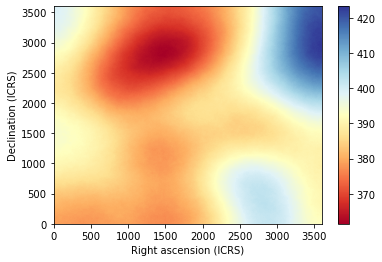

2022-08-13 15:26:14,303 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:14,306 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.84 [MHz] ...
2022-08-13 15:26:16,074 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:18,251 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 15:26:18,575 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_123.84.fits']


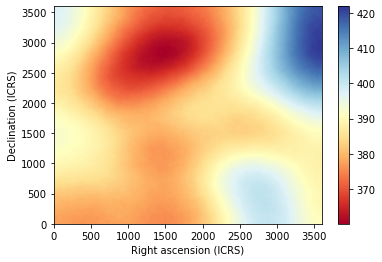

2022-08-13 15:26:20,731 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:20,734 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.00 [MHz] ...
2022-08-13 15:26:22,478 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:24,639 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 15:26:24,949 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_124.00.fits']


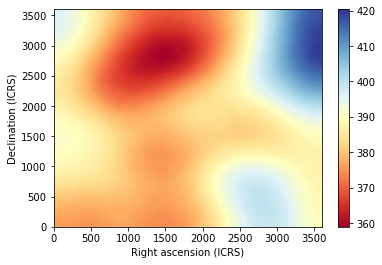

2022-08-13 15:26:27,154 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:27,157 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.16 [MHz] ...
2022-08-13 15:26:28,871 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:31,034 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 15:26:31,329 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_124.16.fits']


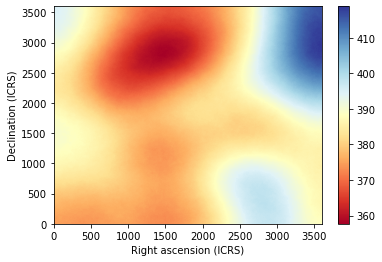

2022-08-13 15:26:33,554 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:33,556 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.32 [MHz] ...
2022-08-13 15:26:35,375 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:37,589 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 15:26:37,912 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_124.32.fits']


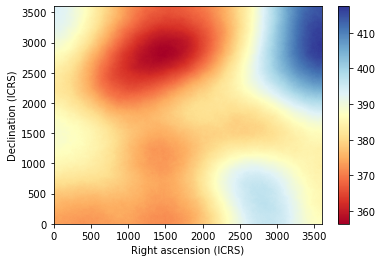

2022-08-13 15:26:40,100 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:40,102 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.48 [MHz] ...
2022-08-13 15:26:41,859 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:44,102 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 15:26:44,416 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_124.48.fits']


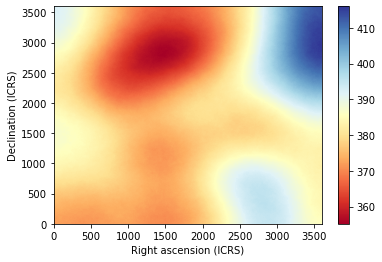

2022-08-13 15:26:46,566 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:46,569 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.64 [MHz] ...
2022-08-13 15:26:48,355 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:50,545 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 15:26:50,872 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_124.64.fits']


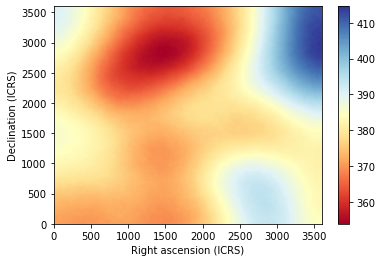

2022-08-13 15:26:53,035 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:53,038 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.80 [MHz] ...
2022-08-13 15:26:54,794 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:26:56,960 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 15:26:57,265 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_124.80.fits']


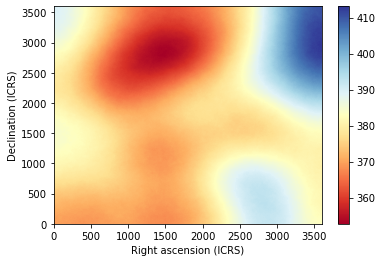

2022-08-13 15:26:59,431 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:59,434 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.96 [MHz] ...
2022-08-13 15:27:01,184 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:03,355 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 15:27:03,670 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_124.96.fits']


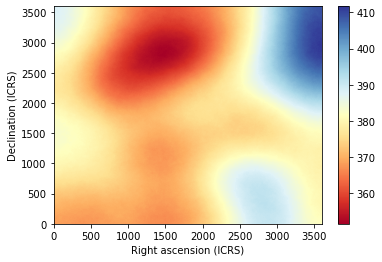

2022-08-13 15:27:06,504 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:06,507 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.12 [MHz] ...
2022-08-13 15:27:08,259 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:10,550 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 15:27:10,884 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_125.12.fits']


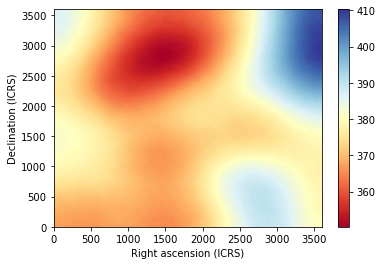

2022-08-13 15:27:13,047 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:13,050 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.28 [MHz] ...
2022-08-13 15:27:14,823 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:17,049 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 15:27:17,377 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_125.28.fits']


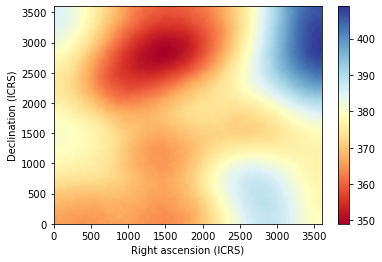

2022-08-13 15:27:19,525 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:19,528 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.44 [MHz] ...
2022-08-13 15:27:21,296 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:23,441 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 15:27:23,742 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_125.44.fits']


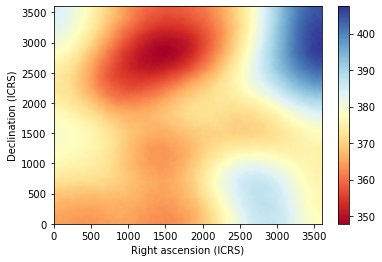

2022-08-13 15:27:25,908 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:25,910 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.60 [MHz] ...
2022-08-13 15:27:27,659 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:29,818 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 15:27:30,111 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_125.60.fits']


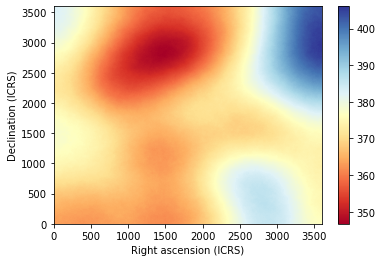

2022-08-13 15:27:32,307 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:32,309 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.76 [MHz] ...
2022-08-13 15:27:34,132 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:36,357 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 15:27:36,679 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_125.76.fits']


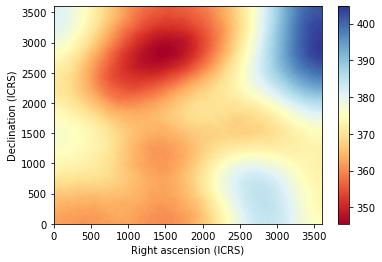

2022-08-13 15:27:38,848 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:38,851 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.92 [MHz] ...
2022-08-13 15:27:40,632 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:42,866 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 15:27:43,179 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_125.92.fits']


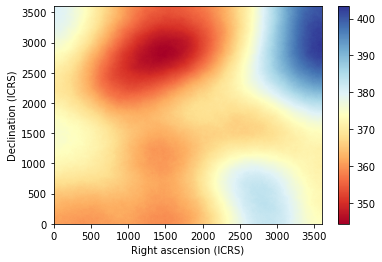

2022-08-13 15:27:45,324 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:45,326 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.08 [MHz] ...
2022-08-13 15:27:47,093 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:49,290 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 15:27:49,598 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_126.08.fits']


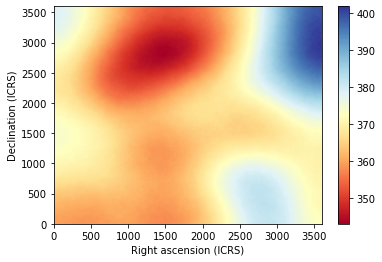

2022-08-13 15:27:51,784 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:51,787 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.24 [MHz] ...
2022-08-13 15:27:53,554 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:27:55,690 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 15:27:55,990 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_126.24.fits']


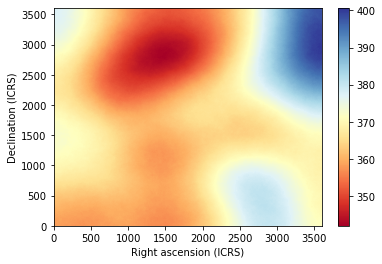

2022-08-13 15:27:58,157 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:58,159 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.40 [MHz] ...
2022-08-13 15:27:59,910 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:02,071 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 15:28:02,388 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_126.40.fits']


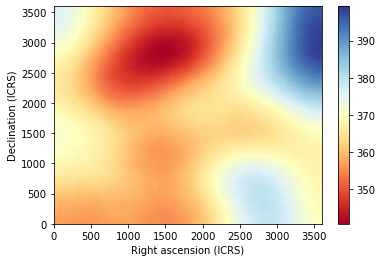

2022-08-13 15:28:04,535 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:04,538 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.56 [MHz] ...
2022-08-13 15:28:06,287 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:08,467 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 15:28:08,787 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_126.56.fits']


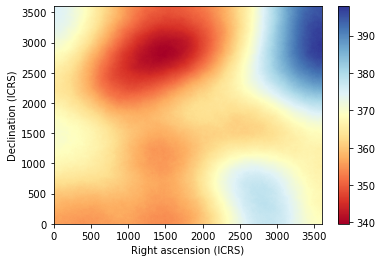

2022-08-13 15:28:10,927 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:10,929 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.72 [MHz] ...
2022-08-13 15:28:12,656 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:14,835 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 15:28:15,138 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_126.72.fits']


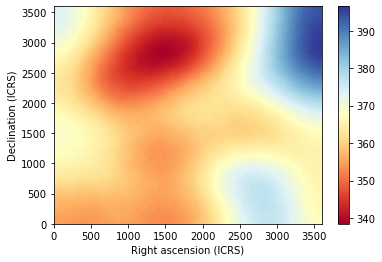

2022-08-13 15:28:17,985 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:17,988 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.88 [MHz] ...
2022-08-13 15:28:19,775 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:22,003 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 15:28:22,322 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_126.88.fits']


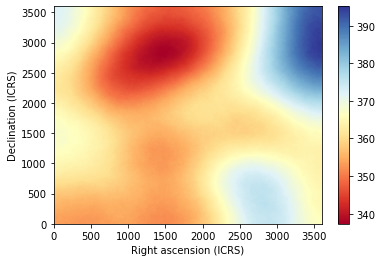

2022-08-13 15:28:24,558 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:24,560 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.04 [MHz] ...
2022-08-13 15:28:26,347 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:28,563 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 15:28:28,883 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_127.04.fits']


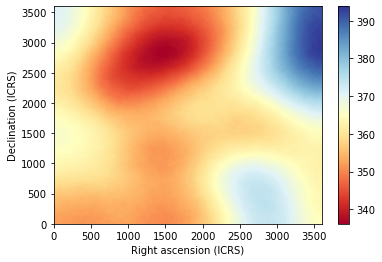

2022-08-13 15:28:31,087 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:31,090 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.20 [MHz] ...
2022-08-13 15:28:32,907 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:35,142 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 15:28:35,461 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_127.20.fits']


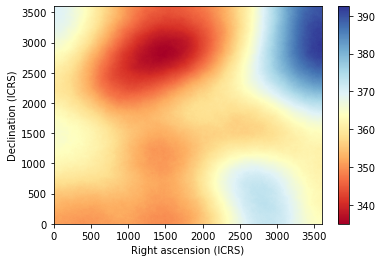

2022-08-13 15:28:37,649 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:37,652 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.36 [MHz] ...
2022-08-13 15:28:39,445 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:41,707 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 15:28:42,023 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_127.36.fits']


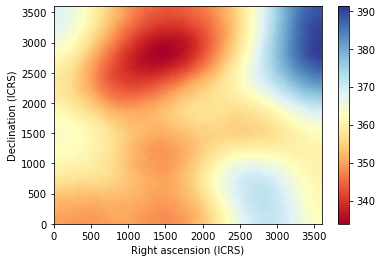

2022-08-13 15:28:44,190 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:44,193 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.52 [MHz] ...
2022-08-13 15:28:45,973 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:48,173 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 15:28:48,487 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_127.52.fits']


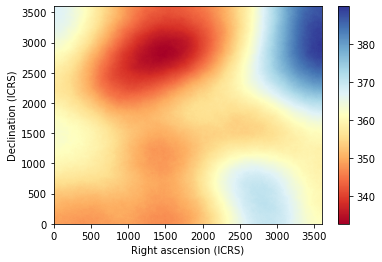

2022-08-13 15:28:50,647 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:50,649 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.68 [MHz] ...
2022-08-13 15:28:52,418 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:28:54,558 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 15:28:54,857 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_127.68.fits']


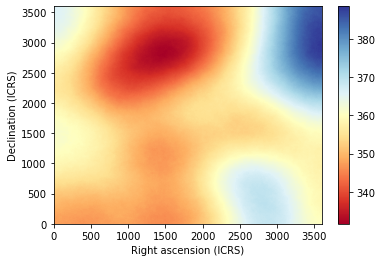

2022-08-13 15:28:57,012 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:57,015 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.84 [MHz] ...
2022-08-13 15:28:58,767 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:00,941 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 15:29:01,280 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_127.84.fits']


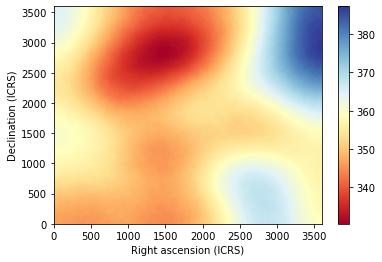

2022-08-13 15:29:03,454 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:03,457 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 128.00 [MHz] ...
2022-08-13 15:29:05,211 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:07,425 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 15:29:07,733 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov4_44-23_128.00.fits']


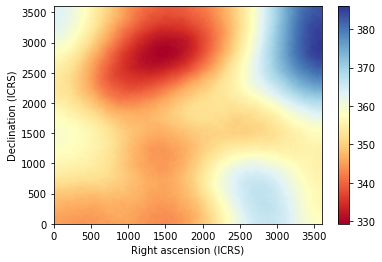

In [27]:
do_simulation(Sfov2.freqs['low']['f'], Sfov2, fov2_outlow)

##### Mid band

2022-08-13 15:29:09,917 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:09,919 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.00 [MHz] ...
2022-08-13 15:29:11,650 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:13,839 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 15:29:14,165 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_154.00.fits']


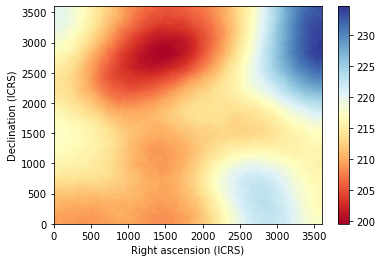

2022-08-13 15:29:16,286 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:16,289 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.16 [MHz] ...
2022-08-13 15:29:18,106 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:20,263 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 15:29:20,567 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_154.16.fits']


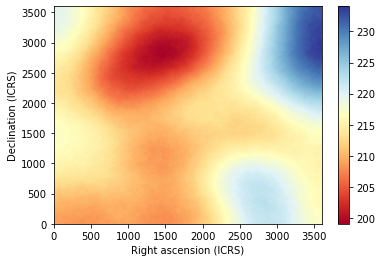

2022-08-13 15:29:22,726 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:22,729 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.32 [MHz] ...
2022-08-13 15:29:24,503 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:26,699 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 15:29:27,098 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_154.32.fits']


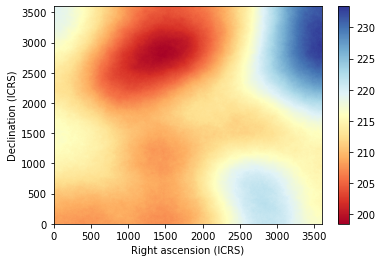

2022-08-13 15:29:29,993 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:29,996 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.48 [MHz] ...
2022-08-13 15:29:31,809 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:34,045 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 15:29:34,711 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_154.48.fits']


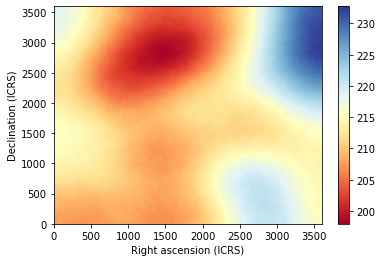

2022-08-13 15:29:36,903 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:36,906 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.64 [MHz] ...
2022-08-13 15:29:38,687 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:40,897 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 15:29:41,212 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_154.64.fits']


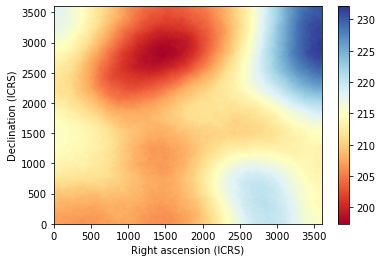

2022-08-13 15:29:43,388 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:43,390 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.80 [MHz] ...
2022-08-13 15:29:45,214 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:47,414 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 15:29:47,727 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_154.80.fits']


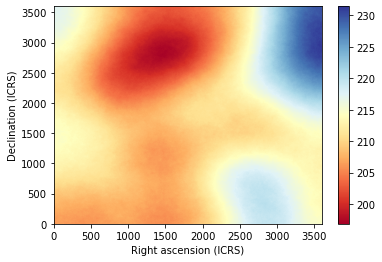

2022-08-13 15:29:49,891 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:49,894 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.96 [MHz] ...
2022-08-13 15:29:51,666 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:29:53,868 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 15:29:54,228 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_154.96.fits']


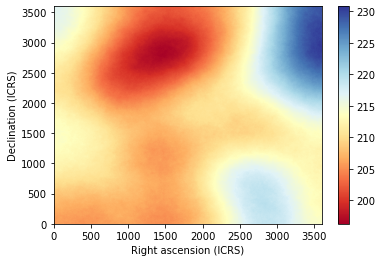

2022-08-13 15:29:56,383 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:56,385 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.12 [MHz] ...
2022-08-13 15:29:58,150 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:00,317 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 15:30:00,617 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_155.12.fits']


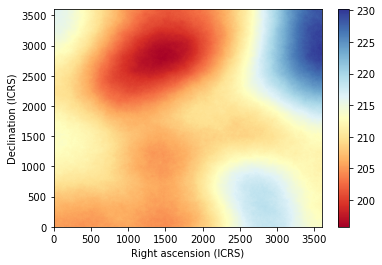

2022-08-13 15:30:02,773 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:02,776 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.28 [MHz] ...
2022-08-13 15:30:04,547 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:06,748 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 15:30:07,053 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_155.28.fits']


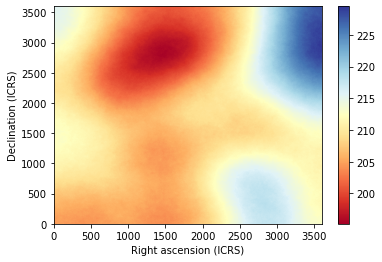

2022-08-13 15:30:09,207 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:09,210 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.44 [MHz] ...
2022-08-13 15:30:10,999 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:13,177 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 15:30:13,489 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_155.44.fits']


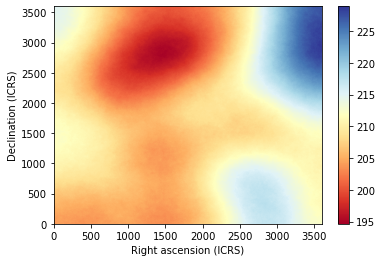

2022-08-13 15:30:15,630 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:15,633 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.60 [MHz] ...
2022-08-13 15:30:17,425 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:19,571 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 15:30:19,888 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_155.60.fits']


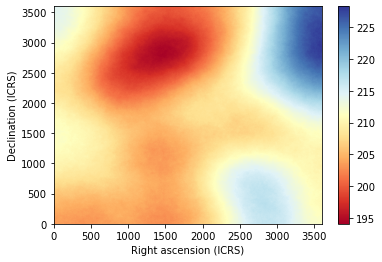

2022-08-13 15:30:22,084 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:22,087 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.76 [MHz] ...
2022-08-13 15:30:23,862 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:26,007 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 15:30:26,364 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_155.76.fits']


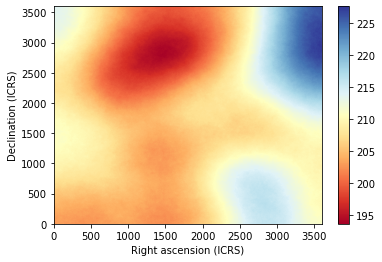

2022-08-13 15:30:28,553 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:28,556 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.92 [MHz] ...
2022-08-13 15:30:30,349 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:32,585 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 15:30:32,964 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_155.92.fits']


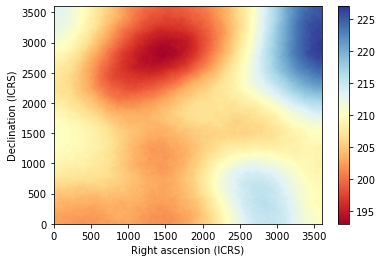

2022-08-13 15:30:35,156 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:35,159 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.08 [MHz] ...
2022-08-13 15:30:36,911 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:39,109 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 15:30:39,423 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_156.08.fits']


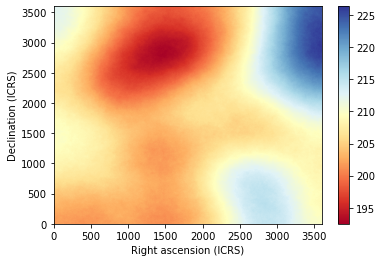

2022-08-13 15:30:42,296 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:42,298 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.24 [MHz] ...
2022-08-13 15:30:44,092 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:46,306 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 15:30:46,629 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_156.24.fits']


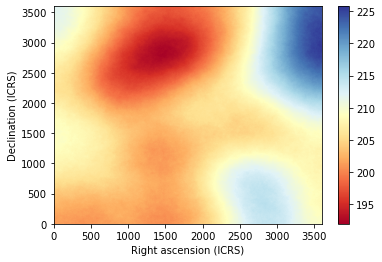

2022-08-13 15:30:48,824 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:48,827 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.40 [MHz] ...
2022-08-13 15:30:50,612 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:52,826 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 15:30:53,131 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_156.40.fits']


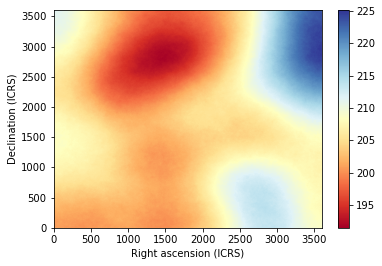

2022-08-13 15:30:55,328 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:55,331 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.56 [MHz] ...
2022-08-13 15:30:57,110 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:30:59,350 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 15:30:59,664 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_156.56.fits']


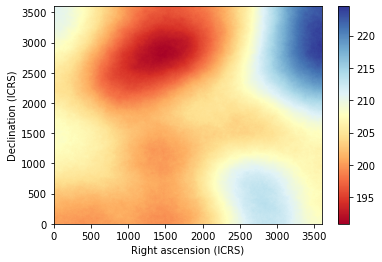

2022-08-13 15:31:01,845 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:01,848 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.72 [MHz] ...
2022-08-13 15:31:03,599 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:05,795 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 15:31:06,105 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_156.72.fits']


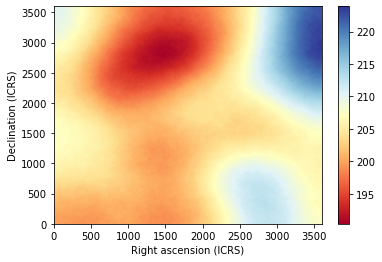

2022-08-13 15:31:08,256 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:08,259 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.88 [MHz] ...
2022-08-13 15:31:10,064 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:12,206 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 15:31:12,549 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_156.88.fits']


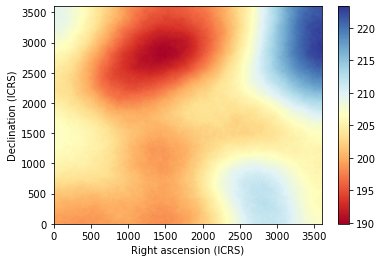

2022-08-13 15:31:14,701 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:14,703 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.04 [MHz] ...
2022-08-13 15:31:16,452 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:18,632 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 15:31:18,956 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_157.04.fits']


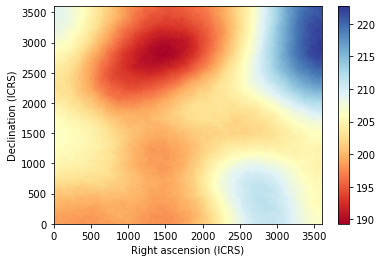

2022-08-13 15:31:21,124 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:21,126 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.20 [MHz] ...
2022-08-13 15:31:22,880 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:25,096 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 15:31:25,442 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_157.20.fits']


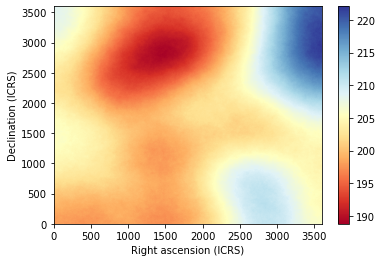

2022-08-13 15:31:27,686 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:27,689 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.36 [MHz] ...
2022-08-13 15:31:29,490 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:31,758 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 15:31:32,084 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_157.36.fits']


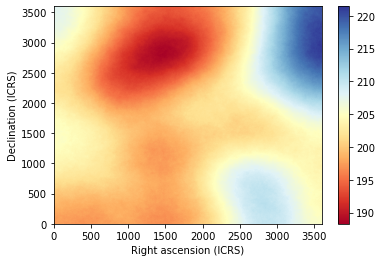

2022-08-13 15:31:34,285 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:34,288 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.52 [MHz] ...
2022-08-13 15:31:36,043 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:38,235 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 15:31:38,548 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_157.52.fits']


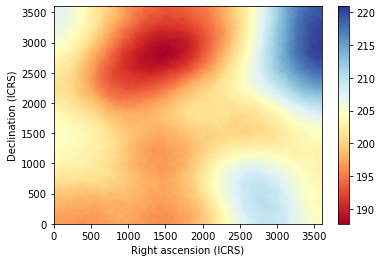

2022-08-13 15:31:40,722 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:40,724 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.68 [MHz] ...
2022-08-13 15:31:42,513 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:44,674 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 15:31:44,976 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_157.68.fits']


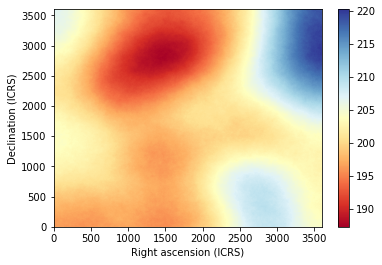

2022-08-13 15:31:47,174 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:47,177 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.84 [MHz] ...
2022-08-13 15:31:48,937 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:51,140 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 15:31:51,458 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_157.84.fits']


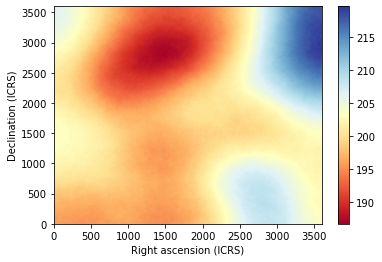

2022-08-13 15:31:54,322 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:54,324 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 15:31:56,099 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:31:58,414 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 15:31:58,752 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_158.00.fits']


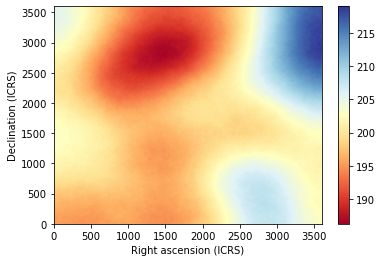

2022-08-13 15:32:00,961 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:00,964 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.16 [MHz] ...
2022-08-13 15:32:02,721 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:04,936 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 15:32:05,252 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_158.16.fits']


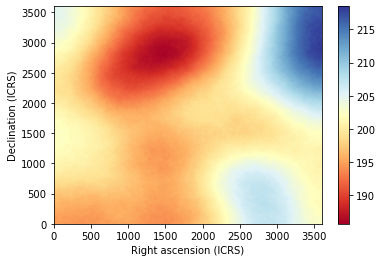

2022-08-13 15:32:07,429 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:07,431 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.32 [MHz] ...
2022-08-13 15:32:09,220 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:11,385 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 15:32:11,687 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_158.32.fits']


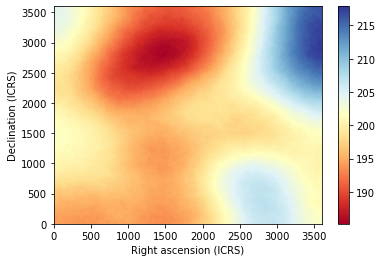

2022-08-13 15:32:13,865 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:13,867 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.48 [MHz] ...
2022-08-13 15:32:15,625 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:17,822 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 15:32:18,145 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_158.48.fits']


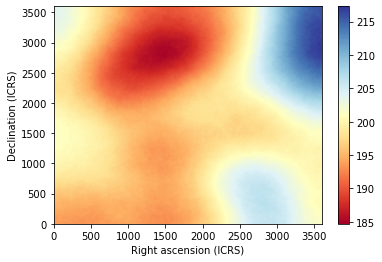

2022-08-13 15:32:20,283 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:20,285 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.64 [MHz] ...
2022-08-13 15:32:22,040 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:24,277 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 15:32:24,623 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_158.64.fits']


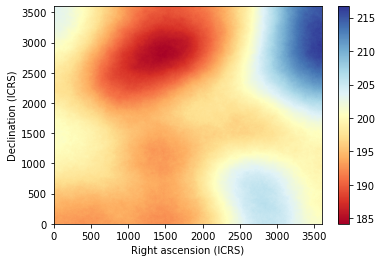

2022-08-13 15:32:26,871 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:26,874 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.80 [MHz] ...
2022-08-13 15:32:28,663 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:30,927 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 15:32:31,256 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_158.80.fits']


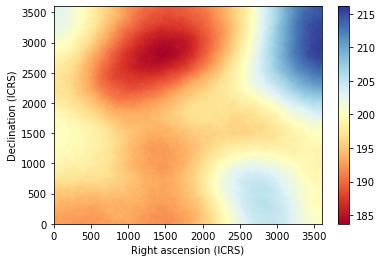

2022-08-13 15:32:33,455 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:33,458 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.96 [MHz] ...
2022-08-13 15:32:35,232 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:37,428 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 15:32:37,741 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_158.96.fits']


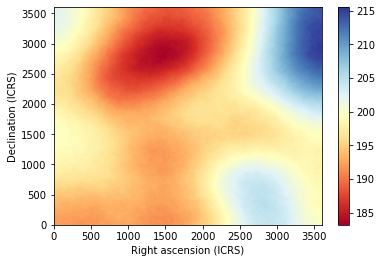

2022-08-13 15:32:39,915 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:39,918 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.12 [MHz] ...
2022-08-13 15:32:41,706 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:43,856 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 15:32:44,196 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_159.12.fits']


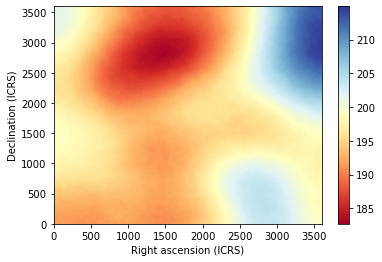

2022-08-13 15:32:46,373 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:46,376 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.28 [MHz] ...
2022-08-13 15:32:48,135 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:50,310 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 15:32:50,617 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_159.28.fits']


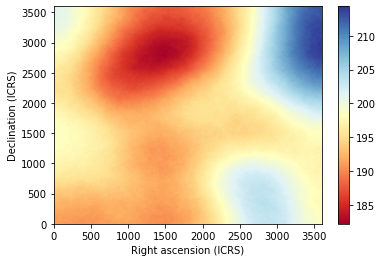

2022-08-13 15:32:52,794 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:52,796 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.44 [MHz] ...
2022-08-13 15:32:54,558 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:32:56,767 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 15:32:57,089 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_159.44.fits']


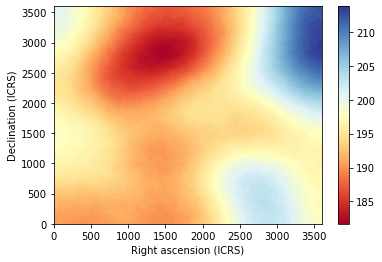

2022-08-13 15:32:59,255 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:59,258 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.60 [MHz] ...
2022-08-13 15:33:00,984 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:03,174 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 15:33:03,481 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_159.60.fits']


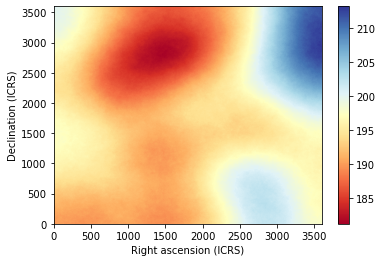

2022-08-13 15:33:06,342 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:06,345 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.76 [MHz] ...
2022-08-13 15:33:08,139 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:10,356 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 15:33:10,677 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_159.76.fits']


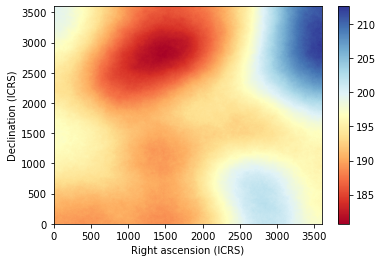

2022-08-13 15:33:12,873 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:12,875 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.92 [MHz] ...
2022-08-13 15:33:14,658 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:16,862 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 15:33:17,167 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_159.92.fits']


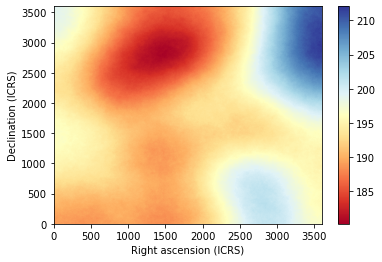

2022-08-13 15:33:19,365 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:19,367 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.08 [MHz] ...
2022-08-13 15:33:21,137 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:23,414 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 15:33:23,775 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_160.08.fits']


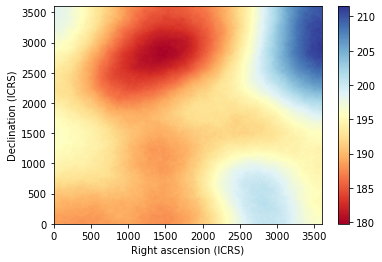

2022-08-13 15:33:25,976 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:25,979 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.24 [MHz] ...
2022-08-13 15:33:27,779 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:30,040 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 15:33:30,363 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_160.24.fits']


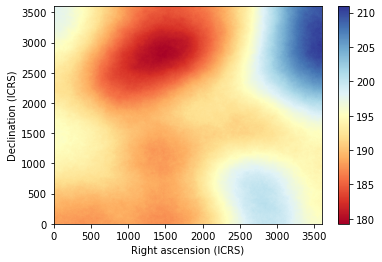

2022-08-13 15:33:32,565 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:32,567 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.40 [MHz] ...
2022-08-13 15:33:34,350 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:36,557 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 15:33:36,888 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_160.40.fits']


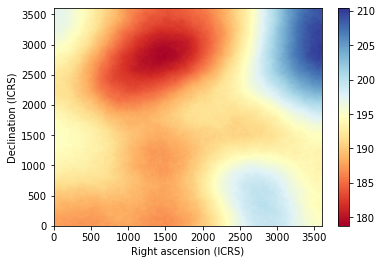

2022-08-13 15:33:39,035 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:39,038 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.56 [MHz] ...
2022-08-13 15:33:40,810 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:42,973 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 15:33:43,279 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_160.56.fits']


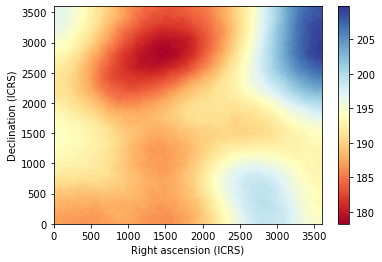

2022-08-13 15:33:45,455 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:45,458 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.72 [MHz] ...
2022-08-13 15:33:47,199 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:49,372 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 15:33:49,670 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_160.72.fits']


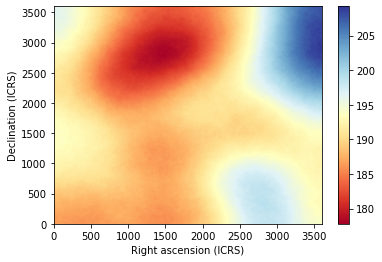

2022-08-13 15:33:51,802 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:51,805 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.88 [MHz] ...
2022-08-13 15:33:53,560 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:33:55,771 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 15:33:56,077 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_160.88.fits']


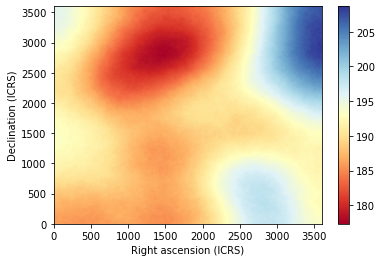

2022-08-13 15:33:58,234 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:58,237 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.04 [MHz] ...
2022-08-13 15:33:59,965 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:02,161 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 15:34:02,470 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_161.04.fits']


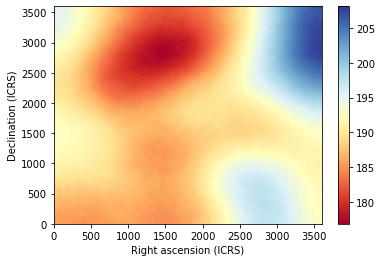

2022-08-13 15:34:04,622 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:04,625 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.20 [MHz] ...
2022-08-13 15:34:06,421 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:08,563 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 15:34:08,864 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_161.20.fits']


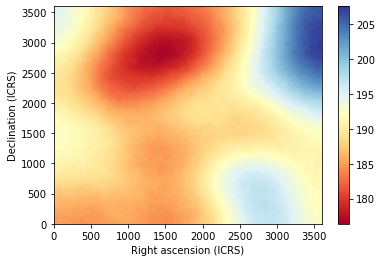

2022-08-13 15:34:11,021 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:11,024 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.36 [MHz] ...
2022-08-13 15:34:12,775 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:14,959 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 15:34:15,268 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_161.36.fits']


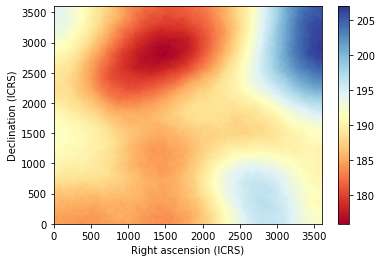

2022-08-13 15:34:18,103 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:18,106 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.52 [MHz] ...
2022-08-13 15:34:19,868 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:22,218 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 15:34:22,564 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_161.52.fits']


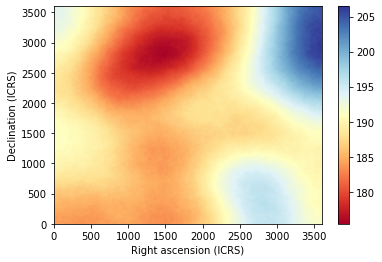

2022-08-13 15:34:24,792 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:24,795 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.68 [MHz] ...
2022-08-13 15:34:26,607 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:28,855 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 15:34:29,174 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_161.68.fits']


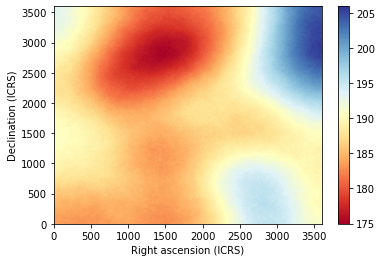

2022-08-13 15:34:31,360 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:31,363 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.84 [MHz] ...
2022-08-13 15:34:33,203 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:35,410 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 15:34:35,721 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_161.84.fits']


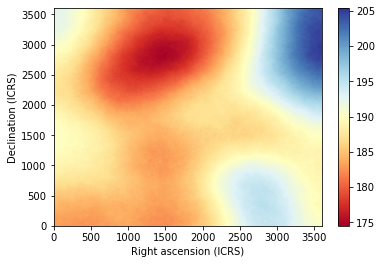

2022-08-13 15:34:37,886 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:37,888 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 162.00 [MHz] ...
2022-08-13 15:34:39,649 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:41,854 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 15:34:42,180 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov4_44-23_162.00.fits']


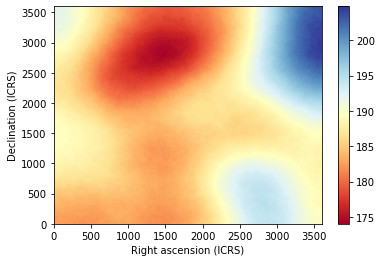

In [28]:
do_simulation(Sfov2.freqs['mid']['f'], Sfov2, fov2_outmid)

##### hig band

2022-08-13 15:34:44,371 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:44,375 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.00 [MHz] ...
2022-08-13 15:34:46,133 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:48,301 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 15:34:48,604 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_188.00.fits']


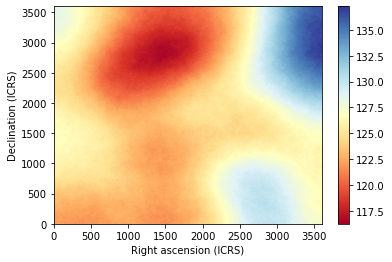

2022-08-13 15:34:50,780 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:50,782 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.16 [MHz] ...
2022-08-13 15:34:52,553 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:34:54,772 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 15:34:55,071 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_188.16.fits']


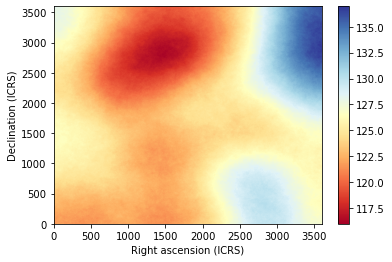

2022-08-13 15:34:57,172 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:57,174 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.32 [MHz] ...
2022-08-13 15:34:58,842 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:00,912 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 15:35:01,201 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_188.32.fits']


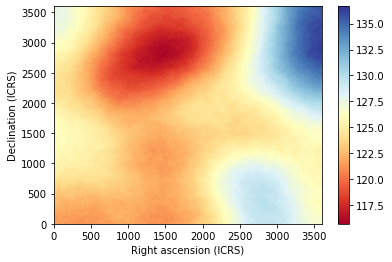

2022-08-13 15:35:03,278 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:03,280 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.48 [MHz] ...
2022-08-13 15:35:04,953 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:07,011 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 15:35:07,296 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_188.48.fits']


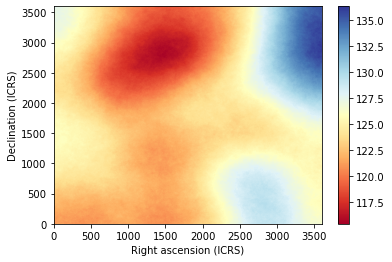

2022-08-13 15:35:09,369 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:09,371 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.64 [MHz] ...
2022-08-13 15:35:11,229 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:13,404 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 15:35:13,736 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_188.64.fits']


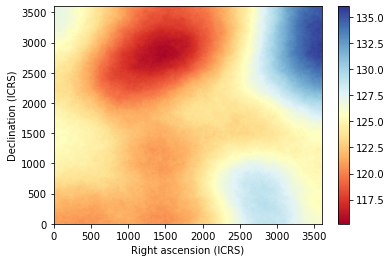

2022-08-13 15:35:15,884 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:15,886 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.80 [MHz] ...
2022-08-13 15:35:17,590 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:19,687 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 15:35:20,016 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_188.80.fits']


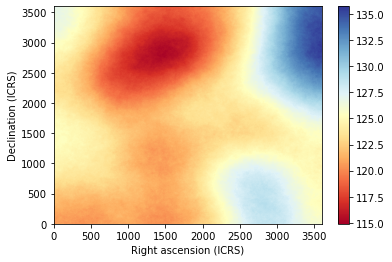

2022-08-13 15:35:22,161 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:22,163 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.96 [MHz] ...
2022-08-13 15:35:23,850 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:25,916 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 15:35:26,210 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_188.96.fits']


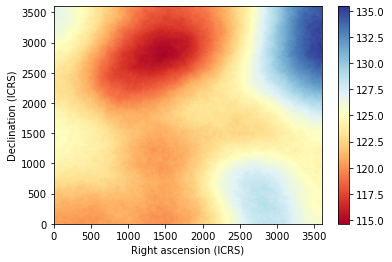

2022-08-13 15:35:28,994 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:28,996 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.12 [MHz] ...
2022-08-13 15:35:30,732 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:32,871 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 15:35:33,193 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_189.12.fits']


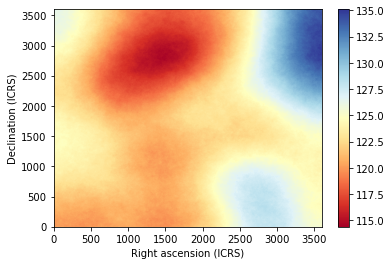

2022-08-13 15:35:35,341 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:35,343 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.28 [MHz] ...
2022-08-13 15:35:37,040 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:39,153 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 15:35:39,458 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_189.28.fits']


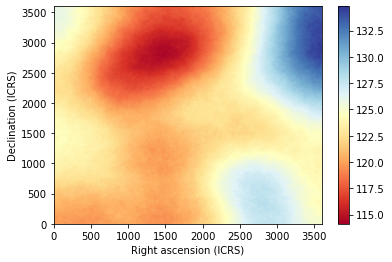

2022-08-13 15:35:41,562 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:41,564 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.44 [MHz] ...
2022-08-13 15:35:43,242 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:45,318 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 15:35:45,615 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_189.44.fits']


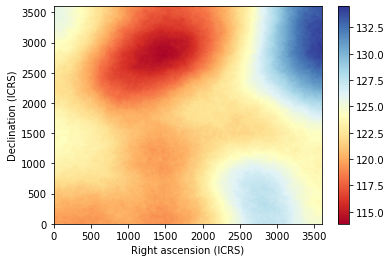

2022-08-13 15:35:47,742 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:47,744 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.60 [MHz] ...
2022-08-13 15:35:49,419 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:51,481 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 15:35:51,773 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_189.60.fits']


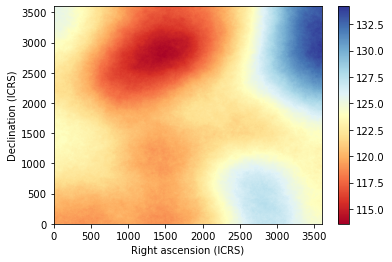

2022-08-13 15:35:53,857 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:53,859 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.76 [MHz] ...
2022-08-13 15:35:55,531 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:35:57,585 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 15:35:57,871 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_189.76.fits']


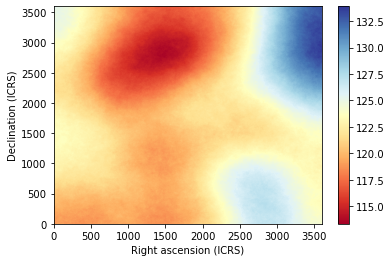

2022-08-13 15:35:59,949 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:59,950 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.92 [MHz] ...
2022-08-13 15:36:01,612 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:03,665 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 15:36:03,948 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_189.92.fits']


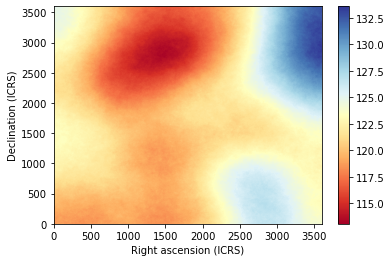

2022-08-13 15:36:06,020 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:06,022 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.08 [MHz] ...
2022-08-13 15:36:07,679 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:09,727 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 15:36:10,009 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_190.08.fits']


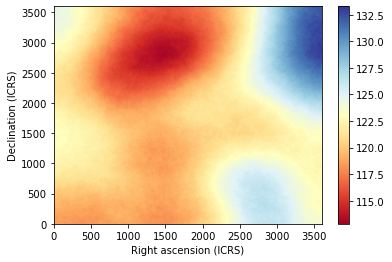

2022-08-13 15:36:12,095 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:12,097 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.24 [MHz] ...
2022-08-13 15:36:13,753 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:15,793 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 15:36:16,072 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_190.24.fits']


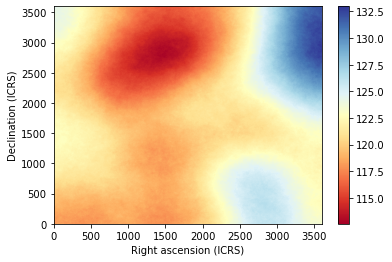

2022-08-13 15:36:18,134 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:18,136 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.40 [MHz] ...
2022-08-13 15:36:19,790 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:21,834 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 15:36:22,111 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_190.40.fits']


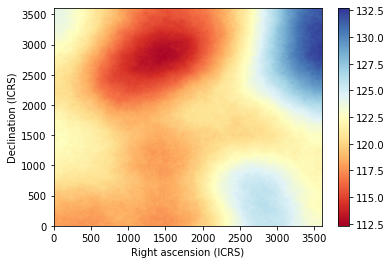

2022-08-13 15:36:24,160 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:24,162 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.56 [MHz] ...
2022-08-13 15:36:25,811 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:27,848 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 15:36:28,126 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_190.56.fits']


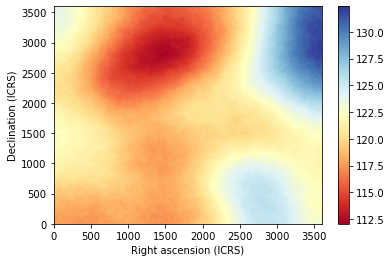

2022-08-13 15:36:30,182 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:30,184 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.72 [MHz] ...
2022-08-13 15:36:31,837 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:33,869 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 15:36:34,145 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_190.72.fits']


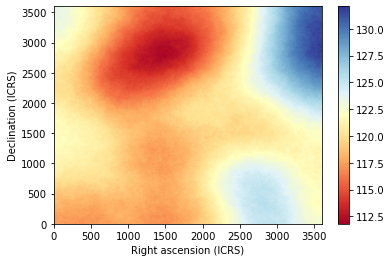

2022-08-13 15:36:36,896 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:36,898 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.88 [MHz] ...
2022-08-13 15:36:38,604 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:40,699 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 15:36:41,013 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_190.88.fits']


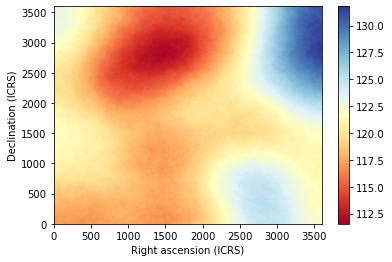

2022-08-13 15:36:43,120 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:43,121 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.04 [MHz] ...
2022-08-13 15:36:44,798 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:46,859 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 15:36:47,150 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_191.04.fits']


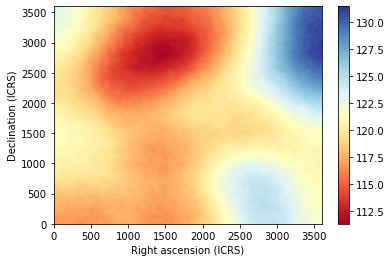

2022-08-13 15:36:49,247 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:49,249 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.20 [MHz] ...
2022-08-13 15:36:50,913 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:52,957 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 15:36:53,246 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_191.20.fits']


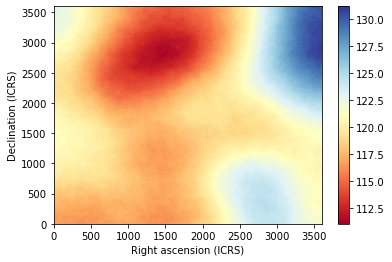

2022-08-13 15:36:55,311 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:55,313 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.36 [MHz] ...
2022-08-13 15:36:56,967 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:36:58,997 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 15:36:59,276 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_191.36.fits']


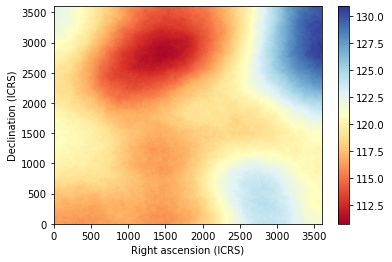

2022-08-13 15:37:01,347 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:01,349 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.52 [MHz] ...
2022-08-13 15:37:03,008 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:05,034 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 15:37:05,310 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_191.52.fits']


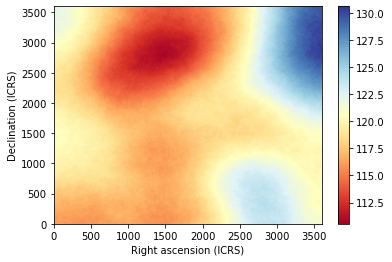

2022-08-13 15:37:07,366 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:07,367 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.68 [MHz] ...
2022-08-13 15:37:09,017 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:11,055 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 15:37:11,330 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_191.68.fits']


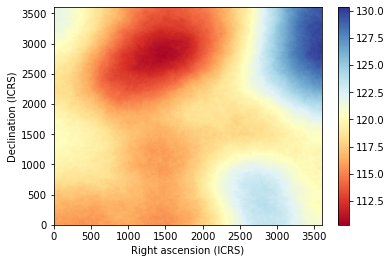

2022-08-13 15:37:13,385 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:13,386 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.84 [MHz] ...
2022-08-13 15:37:15,036 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:17,073 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 15:37:17,351 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_191.84.fits']


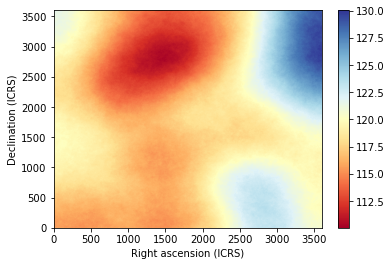

2022-08-13 15:37:19,410 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:19,412 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.00 [MHz] ...
2022-08-13 15:37:21,062 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:23,097 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 15:37:23,373 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_192.00.fits']


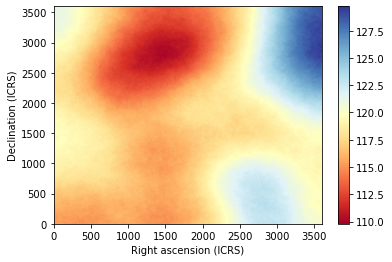

2022-08-13 15:37:25,424 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:25,425 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.16 [MHz] ...
2022-08-13 15:37:27,083 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:29,114 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 15:37:29,390 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_192.16.fits']


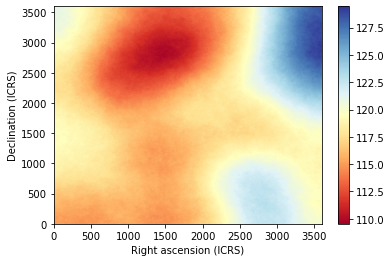

2022-08-13 15:37:31,438 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:31,440 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.32 [MHz] ...
2022-08-13 15:37:33,091 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:35,131 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 15:37:35,409 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_192.32.fits']


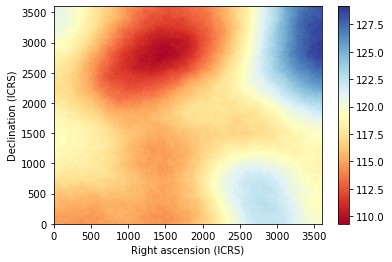

2022-08-13 15:37:37,466 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:37,468 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.48 [MHz] ...
2022-08-13 15:37:39,119 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:41,154 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 15:37:41,430 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_192.48.fits']


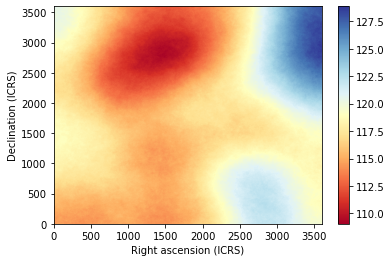

2022-08-13 15:37:44,168 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:44,170 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.64 [MHz] ...
2022-08-13 15:37:45,857 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:47,923 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 15:37:48,229 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_192.64.fits']


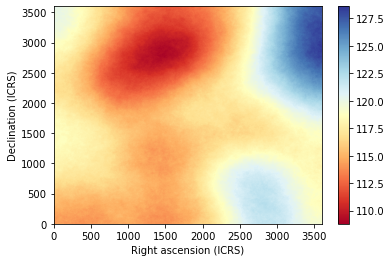

2022-08-13 15:37:50,327 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:50,328 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.80 [MHz] ...
2022-08-13 15:37:51,994 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:37:54,026 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 15:37:54,310 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_192.80.fits']


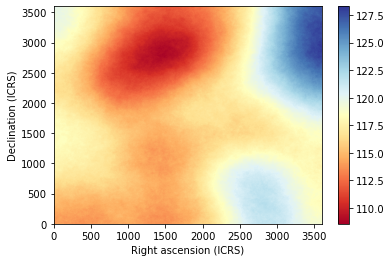

2022-08-13 15:37:56,385 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:56,387 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.96 [MHz] ...
2022-08-13 15:37:58,039 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:00,072 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 15:38:00,351 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_192.96.fits']


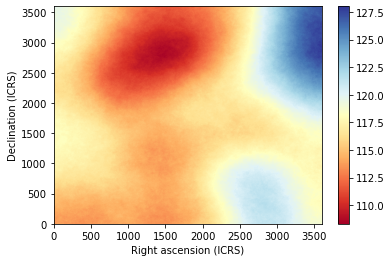

2022-08-13 15:38:02,404 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:02,406 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.12 [MHz] ...
2022-08-13 15:38:04,057 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:06,081 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 15:38:06,357 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_193.12.fits']


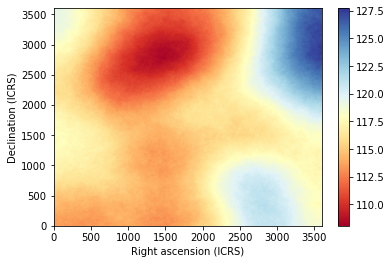

2022-08-13 15:38:08,421 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:08,423 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.28 [MHz] ...
2022-08-13 15:38:10,073 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:12,098 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 15:38:12,373 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_193.28.fits']


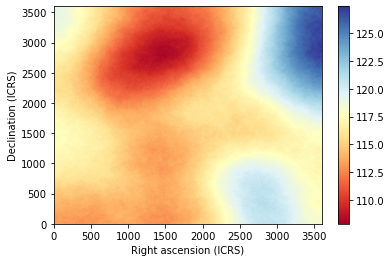

2022-08-13 15:38:14,419 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:14,420 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.44 [MHz] ...
2022-08-13 15:38:16,070 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:18,110 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 15:38:18,384 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_193.44.fits']


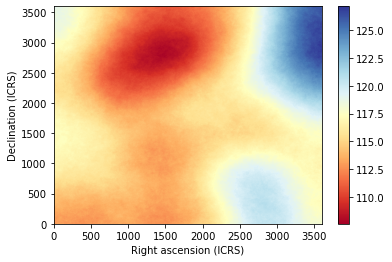

2022-08-13 15:38:20,430 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:20,432 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.60 [MHz] ...
2022-08-13 15:38:22,083 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:24,118 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 15:38:24,398 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_193.60.fits']


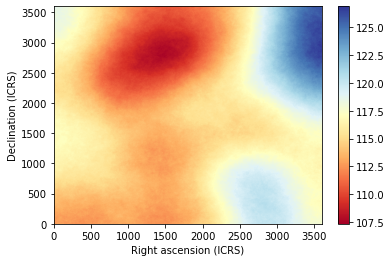

2022-08-13 15:38:26,456 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:26,457 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.76 [MHz] ...
2022-08-13 15:38:28,112 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:30,147 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 15:38:30,422 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_193.76.fits']


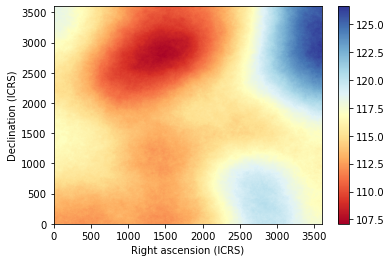

2022-08-13 15:38:32,477 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:32,479 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.92 [MHz] ...
2022-08-13 15:38:34,137 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:36,170 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 15:38:36,447 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_193.92.fits']


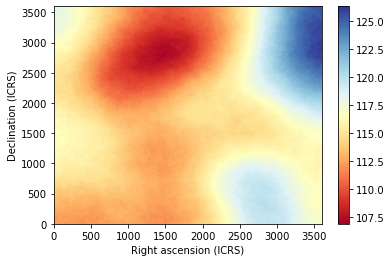

2022-08-13 15:38:38,501 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:38,503 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.08 [MHz] ...
2022-08-13 15:38:40,156 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:42,200 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 15:38:42,476 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_194.08.fits']


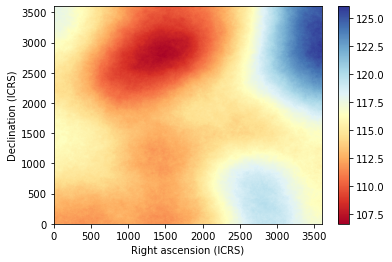

2022-08-13 15:38:44,530 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:44,532 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.24 [MHz] ...
2022-08-13 15:38:46,182 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:48,215 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 15:38:48,492 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_194.24.fits']


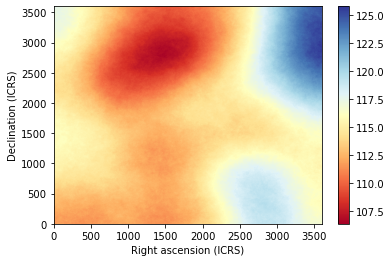

2022-08-13 15:38:51,224 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:51,226 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.40 [MHz] ...
2022-08-13 15:38:52,904 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:38:54,963 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 15:38:55,265 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_194.40.fits']


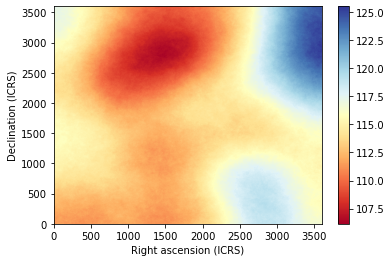

2022-08-13 15:38:57,359 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:57,361 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.56 [MHz] ...
2022-08-13 15:38:59,020 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:01,052 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 15:39:01,330 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_194.56.fits']


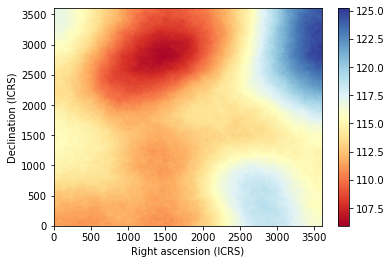

2022-08-13 15:39:03,389 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:03,391 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.72 [MHz] ...
2022-08-13 15:39:05,042 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:07,073 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 15:39:07,351 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_194.72.fits']


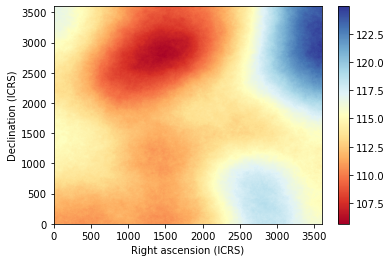

2022-08-13 15:39:09,408 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:09,409 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.88 [MHz] ...
2022-08-13 15:39:11,059 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:13,086 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 15:39:13,362 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_194.88.fits']


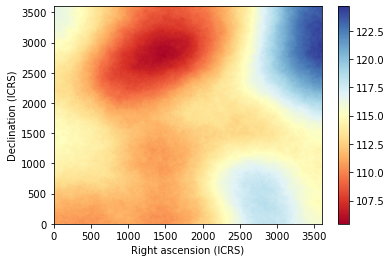

2022-08-13 15:39:15,416 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:15,418 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.04 [MHz] ...
2022-08-13 15:39:17,074 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:19,099 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 15:39:19,376 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_195.04.fits']


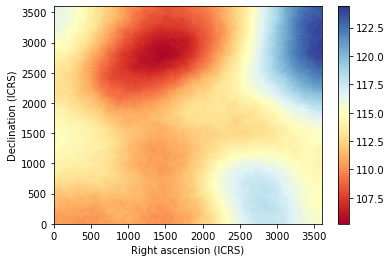

2022-08-13 15:39:21,421 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:21,423 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.20 [MHz] ...
2022-08-13 15:39:23,072 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:25,111 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 15:39:25,386 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_195.20.fits']


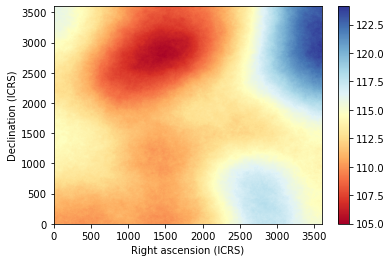

2022-08-13 15:39:27,435 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:27,437 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.36 [MHz] ...
2022-08-13 15:39:29,088 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:31,125 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 15:39:31,402 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_195.36.fits']


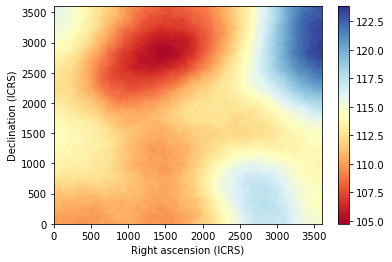

2022-08-13 15:39:33,460 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:33,461 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.52 [MHz] ...
2022-08-13 15:39:35,114 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:37,152 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 15:39:37,427 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_195.52.fits']


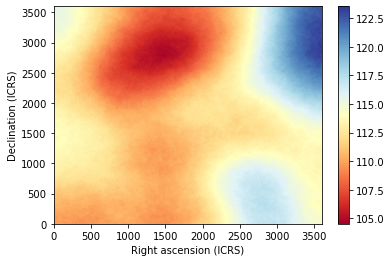

2022-08-13 15:39:39,480 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:39,482 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.68 [MHz] ...
2022-08-13 15:39:41,142 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:43,179 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 15:39:43,455 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_195.68.fits']


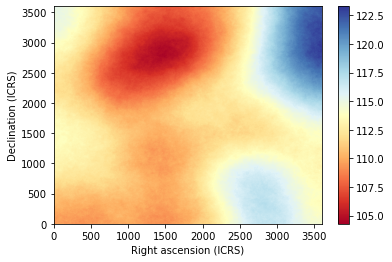

2022-08-13 15:39:45,502 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:45,504 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.84 [MHz] ...
2022-08-13 15:39:47,163 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:49,217 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 15:39:49,493 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_195.84.fits']


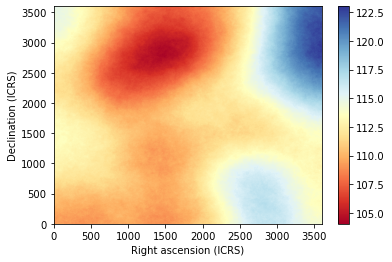

2022-08-13 15:39:51,566 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:51,567 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 196.00 [MHz] ...
2022-08-13 15:39:53,237 : add_ss : INFO : The small scale map is generated using alpha=0.0617456648758479, beta=0.22735294046046467.
2022-08-13 15:39:55,303 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 15:39:55,586 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov4_44-23_196.00.fits']


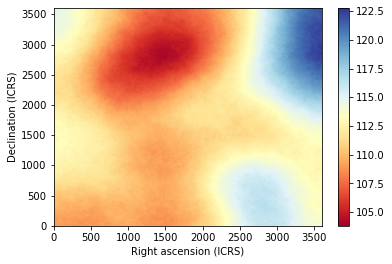

In [29]:
do_simulation(Sfov2.freqs['hig']['f'], Sfov2, fov2_outhig)